### Description

Data that is available includes information from the financial statement of the companies for the previous year (2015). Also, information about the Networth of the company in the following year (2016) is provided which can be used to drive the labeled field. The aim is to create a default variable that should take the value of 1 when net worth next year is negative & 0 when net worth next year is positive.

### Usage

Default

### Format

A dataframe with 3587 observations on 68 variables

### Source

Great Learning

### Problem Statement

Businesses or companies can fall prey to default if they are not able to keep up their debt obligations. Defaults will lead to a lower credit rating for the company which in turn reduces its chances of getting credit in the future and may have to pay higher interests on existing debts as well as any new obligations. From an investor's point of view, he would want to invest in a company if it is capable of handling its financial obligations, can grow quickly, and is able to manage the growth scale.

A balance sheet is a financial statement of a company that provides a snapshot of what a company owns, owes, and the amount invested by the shareholders. Thus, it is an important tool that helps evaluate the performance of a business.

Data that is available includes information from the financial statement of the companies for the previous year (2015). Also, information about the Networth of the company in the following year (2016) is provided which can be used to drive the labeled field.

Explanation of data fields available in Data Dictionary, 'Credit Default Data Dictionary.xlsx'

Hints :

Dependent variable - We need to create a default variable that should take the value of 1 when net worth next year is negative & 0 when net worth next year is positive.

In [ ]:
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import sklearn.metrics as metrics

import warnings
warnings.filterwarnings("ignore")

Let us now go ahead and read the dataset and check the first five rows of the dataset.

### Importing the dataset

In [ ]:
CR = pd.read_excel('Company_Data2015-1.xlsx')

#Glimpse of Data
CR.head()

### Importing dictionary

In [ ]:
CRDict = pd.read_excel('Data_Dictionary.xlsx')

In [517]:
# Data dictionary
pd.set_option('display.max_rows', None)
pd.options.display.max_colwidth = 200
CRDict

,#,Field Name,Description,New Field Name
0,1,Co_Code,Company Code,Co_Code
1,2,Co_Name,Company Name,Co_Name
2,3,Networth Next Year,Value of a company as on 2016 - Next Year(difference between the value of total assets and total liabilities),Networth_Next_Year
3,4,Equity Paid Up,Amount that has been received by the company through the issue of shares to the shareholders,Equity_Paid_Up
4,5,Networth,Value of a company as on 2015 - Current Year,Networth
5,6,Capital Employed,Total amount of capital used for the acquisition of profits by a company,Capital_Employed
6,7,Total Debt,The sum of money borrowed by the company and is due to be paid,Total_Debt
7,8,Gross Block,Total value of all of the assets that a company owns,Gross_Block
8,9,Net Working Capital,"The difference between a company's current assets (cash, accounts receivable, inventories of raw materials and finished goods) and its current liabilities (accounts payable).",Net_Working_Capital
9,10,Current Assets,All the assets of a company that are expected to be sold or used as a result of standard business operations over the next year.,Curr_Assets


In [518]:
CR.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3586.00,16065.39,19776.82,4.00,3029.25,6077.50,24269.50,72493.00
Networth_Next_Year,3586.00,725.05,4769.68,-8021.60,3.98,19.02,123.80,111729.10
Equity_Paid_Up,3586.00,62.97,778.76,0.00,3.75,8.29,19.52,42263.46
Networth,3586.00,649.75,4091.99,-7027.48,3.89,18.58,117.30,81657.35
Capital_Employed,3586.00,2799.61,26975.14,-1824.75,7.60,39.09,226.61,714001.25
Total_Debt,3586.00,1994.82,23652.84,-0.72,0.03,7.49,72.35,652823.81
Gross_Block_,3586.00,594.18,4871.55,-41.19,0.57,15.87,131.90,128477.59
Net_Working_Capital_,3586.00,410.81,6301.22,-13162.42,0.94,10.14,61.17,223257.56
Current_Assets_,3586.00,1960.35,22577.57,-0.91,4.00,24.54,135.28,721166.00
Current_Liabilities_and_Provisions_,3586.00,391.99,2675.00,-0.23,0.73,9.23,65.65,83232.98


### Fixing messy column names (containing spaces) for ease of use

In [519]:
CR.columns = CR.columns.str.replace(' ', '_').str.replace('(', '').str.replace(')', '').str.replace('%', 'perc').str.replace('/', '_to_')

### Checking the dataset (top 5 rows) again after fixing messy names

In [520]:
CR.head()

,Co_Code,Co_Name,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block_,Net_Working_Capital_,Current_Assets_,...,PBITM_perc[Latest],PBDTM_perc[Latest],CPM_perc[Latest],APATM_perc[Latest],Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0,0,45.00,0.00,0.00,1
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-39.74,-57.74,-57.74,-87.18,29,101,2.00,0.31,0.24,1
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.00,-0.03,-0.26,1
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-7.21,-48.13,-47.70,-51.58,93,63,2.00,0.24,1.90,1
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-400.55,-845.88,379.79,274.79,3887,346,0.00,0.01,0.05,1


### Checking the number of rows (observations) and the number of columns (variables)

In [521]:
print('The number of rows (observations) is',CR.shape[0],'\n''The number of columns (variables) is',CR.shape[1])

The number of rows (observations) is 3586 
The number of columns (variables) is 68


### Checking datatype of all columns

In [522]:
CR.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 68 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth_Next_Year                   3586 non-null   float64
 3   Equity_Paid_Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital_Employed                     3586 non-null   float64
 6   Total_Debt                           3586 non-null   float64
 7   Gross_Block_                         3586 non-null   float64
 8   Net_Working_Capital_                 3586 non-null   float64
 9   Current_Assets_                      3586 non-null   float64
 10  Current_Liabilities_and_Provisions_  3586 non-null   float64
 11  Total_Assets_to_Liabilities_  

### Checking for duplicate values

In [523]:
print('The credit risk dataset has', CR.duplicated().sum(), 'duplicate values');

The credit risk dataset has 0 duplicate values


### Check the basic measures of descriptive statistics for the continuous variables once again
### (taking just 2 decimal places)

In [606]:
pd.options.display.float_format = '{:.2f}'.format   

CR.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3586.00,16065.39,19776.82,4.00,3029.25,6077.50,24269.50,72493.00
Networth_Next_Year,3586.00,725.05,4769.68,-8021.60,3.98,19.02,123.80,111729.10
Equity_Paid_Up,3586.00,62.97,778.76,0.00,3.75,8.29,19.52,42263.46
Networth,3586.00,649.75,4091.99,-7027.48,3.89,18.58,117.30,81657.35
Capital_Employed,3586.00,2799.61,26975.14,-1824.75,7.60,39.09,226.61,714001.25
Total_Debt,3586.00,1994.82,23652.84,-0.72,0.03,7.49,72.35,652823.81
Gross_Block_,3586.00,594.18,4871.55,-41.19,0.57,15.87,131.90,128477.59
Net_Working_Capital_,3586.00,410.81,6301.22,-13162.42,0.94,10.14,61.17,223257.56
Current_Assets_,3586.00,1960.35,22577.57,-0.91,4.00,24.54,135.28,721166.00
Current_Liabilities_and_Provisions_,3586.00,391.99,2675.00,-0.23,0.73,9.23,65.65,83232.98


### Creating a binary target variable using 'Networth_Next_Year'

In [525]:
CR['default'] = np.where((CR['Networth_Next_Year'] > 0), 0, 1)

### Checking top 10 rows

In [526]:
CR[['default','Networth_Next_Year']].head(10)

,default,Networth_Next_Year
0,1,-8021.60
1,1,-3986.19
2,1,-3192.58
3,1,-3054.51
4,1,-2967.36
5,1,-2519.40
6,1,-2125.05
7,1,-2100.56
8,1,-1695.75
9,1,-1677.18


### What does variable 'default' look like

In [527]:
CR['default'].value_counts()

0    3198
1     388
Name: default, dtype: int64

### Checking proportion of default

In [528]:
CR['default'].value_counts(normalize = True)

0   0.89
1   0.11
Name: default, dtype: float64

## Missing Values Analysis

### Let's check for missing values in the dataset

In [529]:
print ('The size of the credit risk dataset is', CR.size);

The size of the credit risk dataset is 243848


In [530]:
print('The credit risk dataset has', CR.isnull().sum().sum(), 'missing values');

The credit risk dataset has 118 missing values


In [531]:
print('Percentage of missing values in the dataset is', "{:.2f}".format(round((CR.isnull().sum().sum()/CR.size)*100, 2)))

Percentage of missing values in the dataset is 0.05


### Missing values in each individual column

In [532]:
CR.isnull().sum()

Co_Code                                  0
Co_Name                                  0
Networth_Next_Year                       0
Equity_Paid_Up                           0
Networth                                 0
Capital_Employed                         0
Total_Debt                               0
Gross_Block_                             0
Net_Working_Capital_                     0
Current_Assets_                          0
Current_Liabilities_and_Provisions_      0
Total_Assets_to_Liabilities_             0
Gross_Sales                              0
Net_Sales                                0
Other_Income                             0
Value_Of_Output                          0
Cost_of_Production                       0
Selling_Cost                             0
PBIDT                                    0
PBDT                                     0
PBIT                                     0
PBT                                      0
PAT                                      0
Adjusted_PA

Most of the missing values (103) are in the column Inventory_Velocitiy_Days.

Column Book_Value_Adj._Unit_Curr has 4 missing values.

The following 11 columns have 1 missing value each:-

((Current_Ratio[Latest], Fixed_Assets_Ratio[Latest], Inventory_Ratio[Latest], Debtors_Ratio[Latest], Total_Asset_Turnover_Ratio[Latest], Interest_Cover_Ratio[Latest], PBIDTM_perc[Latest], PBITM_perc[Latest], PBDTM_perc[Latest], CPM_perc[Latest], APATM_perc[Latest]))

### Separating target variable Y

In [533]:
CR_X = CR.drop('default', axis = 1)
CR_Y = CR['default']

In [534]:
CR_X

,Co_Code,Co_Name,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block_,Net_Working_Capital_,Current_Assets_,...,PBIDTM_perc[Latest],PBITM_perc[Latest],PBDTM_perc[Latest],CPM_perc[Latest],APATM_perc[Latest],Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0.00,0,0,45.00,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.00,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.00,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.00,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.00,0.01,0.05
5,2484,Usha Ispat,-2519.40,179.35,-2519.39,-1824.75,694.64,0.02,-1843.74,0.00,...,0.00,0.00,0.00,0.00,0.00,0,0,0.00,0.00,0.00
6,23633,Hanung Toys,-2125.05,30.82,-1031.57,1536.08,2567.65,949.98,804.82,834.86,...,-395.87,-987.73,-396.67,-672.36,-1264.22,456,12,392.00,0.00,-0.01
7,3226,K S Oils,-2100.56,45.92,-1945.45,979.13,2664.04,920.67,263.95,705.76,...,-447.24,-596.97,-456.40,-461.06,-610.80,828,622,799.00,-0.02,-0.03
8,1541,Quadrant Tele.,-1695.75,61.23,-1560.94,-613.79,597.82,1700.27,-1121.96,117.67,...,1.90,-20.43,-3.58,-3.58,-25.91,34,145,2.00,0.92,0.31
9,2334,ITI,-1677.18,288.00,-1947.85,86.35,1220.83,1329.82,-390.53,2536.78,...,19.23,18.18,9.76,9.76,8.71,1112,913,62.00,0.54,1.16


## Outlier Analysis

### Let's check the number of outliers per column

In [535]:
Q1 = CR_X.quantile(0.25)
Q3 = CR_X.quantile(0.75)
IQR = Q3 - Q1
UL = Q3 + 1.5*IQR
LL = Q1 - 1.5*IQR

In [536]:
((CR_X > UL) | (CR_X < LL)).sum()

APATM_perc[Latest]                      933
Adjusted_PAT                            954
Book_Value_Adj._Unit_Curr               486
Book_Value_Unit_Curr                    485
CEPS_annualised_Unit_Curr               602
CP                                      816
CPM_perc[Latest]                        720
Capital_Employed                        596
Capital_expenses_in_forex               694
Cash_Flow_From_Financing_Activities    1005
Cash_Flow_From_Investing_Activities     876
Cash_Flow_From_Operating_Activities     801
Co_Code                                 291
Co_Name                                   0
Cost_of_Production                      560
Creditors_Velocity_Days                 391
Current_Assets_                         577
Current_Liabilities_and_Provisions_     581
Current_Ratio[Latest]                   565
Debtors_Ratio[Latest]                   371
Debtors_Velocity_Days                   398
Equity_Paid_Up                          448
Fixed_Assets_Ratio[Latest]      

### Total outliers in the dataset

In [537]:
print('Total outliers in the dataset are', ((CR_X > UL) | (CR_X < LL)).sum().sum())

Total outliers in the dataset are 42322


### Size of the dataset

In [538]:
print('The size of the credit risk dataset is', CR_X.size)

The size of the credit risk dataset is 240262


### Percentage of outliers in the dataset

In [539]:
print('Percentage of outliers in the dataset is',(42322/240262)*100)

Percentage of outliers in the dataset is 17.614937027078774


In [540]:
print('Percentage of outlier values in the dataset is', "{:.2f}".format(round(17.614937027078774, 2)))

Percentage of outlier values in the dataset is 17.61


### What percent of values in each column are outliers

In [541]:
# Percentage of data points lying above the upper limit
((CR_X > UL).sum()/len(CR_X)*100).sort_values(ascending=False)

ROG-Revenue_expenses_in_forex_perc    22.89
Revenue_earnings_in_forex             20.58
Capital_expenses_in_forex             19.35
Revenue_expenses_in_forex             19.33
PAT                                   18.18
PBT                                   18.07
ROG-Revenue_earnings_in_forex_perc    17.88
CP                                    17.85
Market_Capitalisation                 17.82
Adjusted_PAT                          17.79
PBDT                                  17.76
Cash_Flow_From_Operating_Activities   17.09
Selling_Cost                          16.87
PBIDT                                 16.84
Networth_Next_Year                    16.82
PBIT                                  16.82
Other_Income                          16.79
Capital_Employed                      16.48
Networth                              16.29
Total_Debt                            16.26
Current_Liabilities_and_Provisions_   16.20
Current_Assets_                       16.09
Total_Assets_to_Liabilities_    

In [542]:
# Percentage of data points lying below the lower limit
((CR_X < LL).sum()/len(CR_X)*100).sort_values(ascending=False)

ROG-Revenue_expenses_in_forex_perc    22.14
ROG-Revenue_earnings_in_forex_perc    18.85
Cash_Flow_From_Investing_Activities   17.79
Cash_Flow_From_Financing_Activities   17.29
APATM_perc[Latest]                    14.53
CPM_perc[Latest]                      10.54
ROG-Net_Worth_perc                    10.09
PBDTM_perc[Latest]                     9.96
ROG-Gross_Block_perc                   9.45
PBITM_perc[Latest]                     9.31
ROG-PBT_perc                           9.06
Adjusted_PAT                           8.81
PAT                                    8.56
ROG-PAT_perc                           8.48
ROG-CP_perc                            8.45
ROG-PBDT_perc                          8.42
PBT                                    8.17
ROG-PBIT_perc                          8.03
ROG-Gross_Sales_perc                   7.75
ROG-Net_Sales_perc                     7.70
ROG-PBIDT_perc                         7.50
PBIDTM_perc[Latest]                    7.11
ROG-Cost_of_Production_perc     

### Treat the outliers

In [543]:
CR_X[((CR_X > UL) | (CR_X < LL))]= np.nan

### Checking the outliers after treatment

In [544]:
((CR_X > UL) | (CR_X < LL)).sum()

APATM_perc[Latest]                     0
Adjusted_PAT                           0
Book_Value_Adj._Unit_Curr              0
Book_Value_Unit_Curr                   0
CEPS_annualised_Unit_Curr              0
CP                                     0
CPM_perc[Latest]                       0
Capital_Employed                       0
Capital_expenses_in_forex              0
Cash_Flow_From_Financing_Activities    0
Cash_Flow_From_Investing_Activities    0
Cash_Flow_From_Operating_Activities    0
Co_Code                                0
Co_Name                                0
Cost_of_Production                     0
Creditors_Velocity_Days                0
Current_Assets_                        0
Current_Liabilities_and_Provisions_    0
Current_Ratio[Latest]                  0
Debtors_Ratio[Latest]                  0
Debtors_Velocity_Days                  0
Equity_Paid_Up                         0
Fixed_Assets_Ratio[Latest]             0
Gross_Block_                           0
Gross_Sales     

### Missing values in dataset after converting outliers to NAN

In [545]:
CR_X.isnull().sum()

Co_Code                                 291
Co_Name                                   0
Networth_Next_Year                      676
Equity_Paid_Up                          448
Networth                                650
Capital_Employed                        596
Total_Debt                              583
Gross_Block_                            540
Net_Working_Capital_                    625
Current_Assets_                         577
Current_Liabilities_and_Provisions_     581
Total_Assets_to_Liabilities_            574
Gross_Sales                             554
Net_Sales                               556
Other_Income                            603
Value_Of_Output                         559
Cost_of_Production                      560
Selling_Cost                            605
PBIDT                                   671
PBDT                                    815
PBIT                                    720
PBT                                     941
PAT                             

### Let's check for missing values in the dataset

In [546]:
print ('The size of the credit risk dataset is', CR_X.size);

The size of the credit risk dataset is 240262


In [547]:
print('The credit risk dataset has', CR_X.isnull().sum().sum(), 'missing values');

The credit risk dataset has 42440 missing values


In [548]:
print('Percentage of missing values in the dataset is', "{:.2f}".format(round((CR_X.isnull().sum().sum()/CR_X.size)*100, 2)))

Percentage of missing values in the dataset is 17.66


In [377]:
CR_X = CR_X.drop(['Co_Code', 'Co_Name', 'Networth_Next_Year'], axis = 1)

### Why we dropped some columns:

'Co_Code' and 'Co_Name':- These are identifiers, not needed for model building.

Networth_Next_Year:- Features that have been translated directly to get the target can never be used as predictors, because then the model will be 100% accurate. In this case Networth_Next_Year was translated into default.

In [378]:
CR_X.shape

(3586, 64)

In [379]:
CR_sub1 = pd.concat([CR_X, CR_Y], axis =1 )

### Distribution of variables

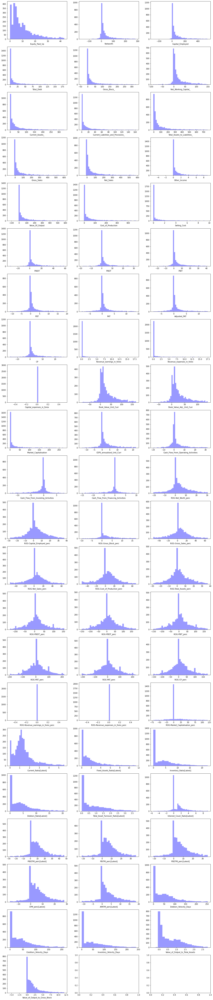

In [460]:
fig, ax = plt.subplots(figsize = (20, 100), nrows = 22, ncols = 3)

for i, col in enumerate(CR_X.columns):
        sns.distplot(CR_X[col], ax = ax[i//3, i%3], kde = False, color = 'blue')

### Checking for skewness

In [462]:
pd.DataFrame(CR_X.skew().sort_values(ascending=False),columns=['Skewness'])

,Skewness
Revenue_earnings_in_forex,3.61
Revenue_expenses_in_forex,3.10
Market_Capitalisation,2.52
Selling_Cost,2.41
Total_Debt,2.25
Other_Income,2.24
Current_Liabilities_and_Provisions_,2.22
Total_Assets_to_Liabilities_,2.14
Gross_Sales,2.14
Net_Sales,2.14


### Visual inspection of missing values in the dataset

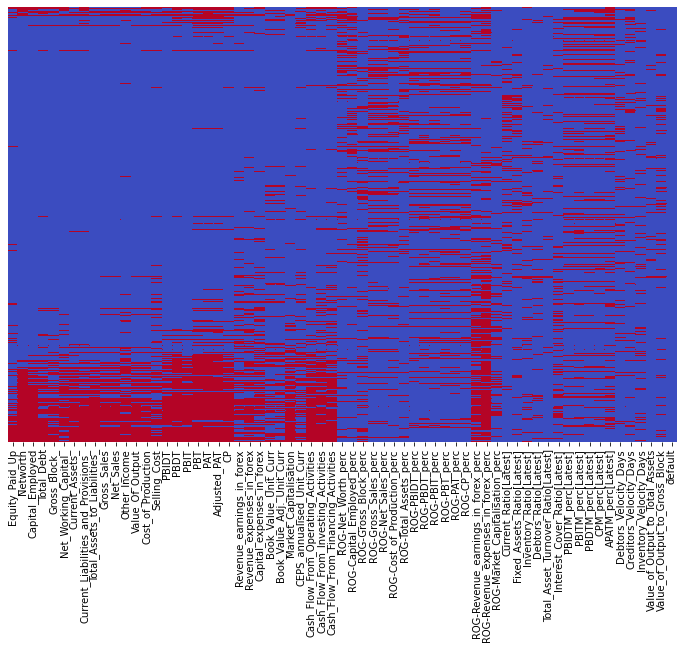

In [380]:
plt.figure(figsize = (12,8))
sns.heatmap(CR_sub1.isnull(), cbar = False, cmap = 'coolwarm', yticklabels = False)
plt.show()

### Inspecting total missing values by each row

In [381]:
CR_sub1.isnull().sum(axis = 1)

0       19
1       34
2       43
3       36
4       35
5        9
6       37
7       34
8       24
9       27
10      20
11      34
12      21
13      35
14      27
15      35
16      34
17      31
18      12
19      22
20      23
21      16
22      33
23      38
24      28
25      21
26      14
27      11
28      14
29      33
30      27
31      22
32      21
33      15
34      30
35      28
36      22
37      30
38      11
39      25
40      25
41      27
42      16
43       4
44      23
45      21
46      34
47      27
48      29
49      10
50      28
51      28
52      16
53      35
54      31
55      20
56      17
57      17
58      10
59      12
60      23
61      20
62      29
63      15
64      19
65      16
66      32
67      26
68      15
69      17
70      23
71      16
72       9
73      11
74      34
75      18
76      21
77      26
78      20
79      18
80      20
81       5
82      23
83      10
84      22
85      21
86      14
87      14
88      24
89      23
90      26

In [382]:
CR_sub1_temp = CR_sub1[CR_sub1.isnull().sum(axis = 1) <= 6]

In [383]:
CR_sub1_temp.shape

(1460, 65)

In [384]:
CR_sub1_temp['default'].value_counts()

0    1319
1     141
Name: default, dtype: int64

In [385]:
CR_sub1['default'].value_counts()

0    3198
1     388
Name: default, dtype: int64

In [386]:
141/388

0.3634020618556701

In [387]:
1319/3198

0.41244527829893685

If we consider availability of features for deciding the observations to be considered, we will end up losing more than 64% of the actual defaulters. Only 36% is captured.

In [388]:
# Missing values divided by applicable rows
CR_sub1.isnull().sum().sort_values(ascending = False)/CR_sub1.index.size

ROG-Revenue_expenses_in_forex_perc    0.45
ROG-Revenue_earnings_in_forex_perc    0.37
Cash_Flow_From_Financing_Activities   0.28
PAT                                   0.27
Adjusted_PAT                          0.27
PBT                                   0.26
APATM_perc[Latest]                    0.26
Cash_Flow_From_Investing_Activities   0.24
ROG-Gross_Block_perc                  0.23
CP                                    0.23
PBDT                                  0.23
Cash_Flow_From_Operating_Activities   0.22
ROG-Net_Worth_perc                    0.21
Revenue_earnings_in_forex             0.21
Interest_Cover_Ratio[Latest]          0.20
CPM_perc[Latest]                      0.20
PBIT                                  0.20
PBITM_perc[Latest]                    0.20
PBDTM_perc[Latest]                    0.19
Capital_expenses_in_forex             0.19
Revenue_expenses_in_forex             0.19
ROG-Cost_of_Production_perc           0.19
PBIDT                                 0.19
ROG-Gross_S

### Dropping columns with more than 30% missing values

In [389]:
CR_sub2 = CR_sub1.drop(['ROG-Revenue_expenses_in_forex_perc', 'ROG-Revenue_earnings_in_forex_perc'], axis = 1)

In [390]:
CR_sub2.shape

(3586, 63)

### Segregate the predictors and response

In [391]:
predictors = CR_sub2.drop('default', axis = 1)
response = CR_sub2['default']

### Scale the predictors

In [392]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_predictors = pd.DataFrame(scaler.fit_transform(predictors), columns = predictors.columns)

In [393]:
CR_sub3 = pd.concat([scaled_predictors, response], axis = 1)

### Imputing the remaining missing values

In [394]:
from sklearn.impute import KNNImputer

In [395]:
imputer = KNNImputer(n_neighbors=10)

In [396]:
CR_imputed = pd.DataFrame(imputer.fit_transform(CR_sub3), columns = CR_sub3.columns)

In [397]:
CR_imputed.isnull().sum()

Equity_Paid_Up                         0
Networth                               0
Capital_Employed                       0
Total_Debt                             0
Gross_Block_                           0
Net_Working_Capital_                   0
Current_Assets_                        0
Current_Liabilities_and_Provisions_    0
Total_Assets_to_Liabilities_           0
Gross_Sales                            0
Net_Sales                              0
Other_Income                           0
Value_Of_Output                        0
Cost_of_Production                     0
Selling_Cost                           0
PBIDT                                  0
PBDT                                   0
PBIT                                   0
PBT                                    0
PAT                                    0
Adjusted_PAT                           0
CP                                     0
Revenue_earnings_in_forex              0
Revenue_expenses_in_forex              0
Capital_expenses

### Inspect possible correlations between independent variables

<AxesSubplot:>

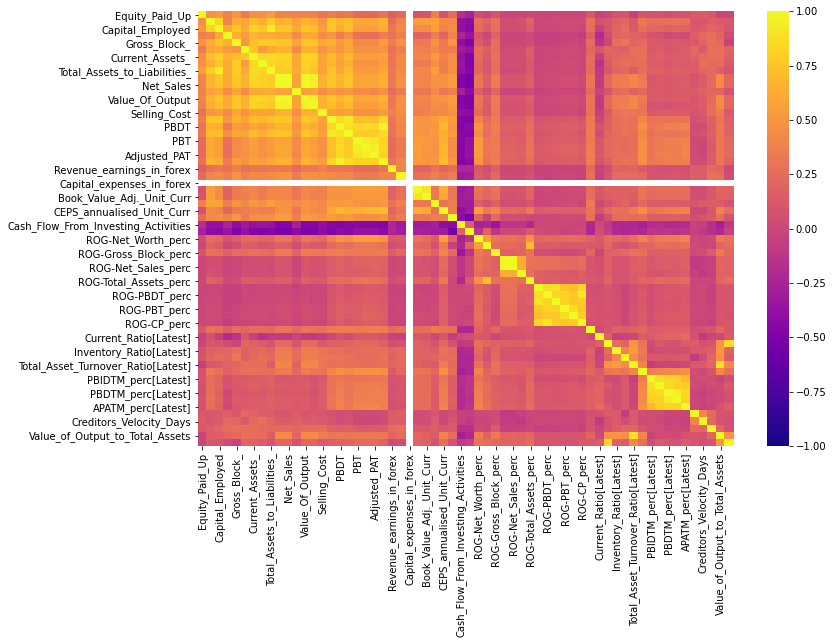

In [398]:
plt.figure(figsize = (12,8))
cor_matrix = CR_imputed.drop('default', axis = 1).corr()
sns.heatmap(cor_matrix, cmap = 'plasma', vmin = -1, vmax= 1)

### Converting to X and Y

In [406]:
predictors = CR_imputed.drop('default', axis = 1)
response = CR_imputed['default']

In [407]:
from sklearn.model_selection import train_test_split
import statsmodels.formula.api as SM
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

### Splitting the data into train and test sets

In [408]:
X_train, X_test, y_train, y_test = train_test_split(predictors, response, test_size = 0.33, random_state = 42)

In [409]:
print('Shape of train data:', X_train.shape)
print('Shape of test data:', X_test.shape)
print('Percentage of train data:', round((2402/3586)*100))
print('Percentage of test data:', round((1184/3586)*100))

Shape of train data: (2402, 62)
Shape of test data: (1184, 62)
Percentage of train data: 67
Percentage of test data: 33


### For modeling we will use Logistic Regression with recursive feature elimination or RFE

In [410]:
from sklearn.linear_model import LogisticRegression
LogR = LogisticRegression()

In [411]:
from sklearn.feature_selection import RFE
selector = RFE(estimator = LogR, n_features_to_select=15, step=1)

In [412]:
selector = selector.fit(X_train, y_train)

In [413]:
selector.n_features_

15

In [415]:
selector.ranking_

array([38,  1,  1,  4,  1, 11, 10,  1,  1, 20, 40, 17,  1,  1, 24,  1,  2,
        1, 13, 15, 16,  3, 46, 21, 48,  1,  1, 18, 47, 45, 14, 32,  1,  1,
       39, 34, 35,  9, 23, 43, 42, 30, 41, 29, 44, 36,  1, 12, 28, 33,  7,
        1, 27,  5, 25, 26,  6, 31, 19, 22,  8, 37])

In [416]:
df = pd.DataFrame({'Feature': scaled_predictors.columns, 'Rank': selector.ranking_})
df[df['Rank'] == 1]

,Feature,Rank
1,Networth,1
2,Capital_Employed,1
4,Gross_Block_,1
7,Current_Liabilities_and_Provisions_,1
8,Total_Assets_to_Liabilities_,1
12,Value_Of_Output,1
13,Cost_of_Production,1
15,PBIDT,1
17,PBIT,1
25,Book_Value_Unit_Curr,1


### Validating the model on train and test set

In [417]:
from sklearn.metrics import confusion_matrix, classification_report

In [418]:
pred_train = selector.predict(X_train)
pred_test = selector.predict(X_test)

In [419]:
print(confusion_matrix(y_train, pred_train))

[[2136   21]
 [  96  149]]


AxesSubplot(0.125,0.125;0.62x0.755)


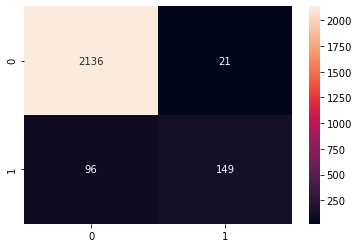

In [598]:
print(sns.heatmap(confusion_matrix(y_train, pred_train),annot=True,fmt='2g'));

In [420]:
print(classification_report(y_train, pred_train))

              precision    recall  f1-score   support

         0.0       0.96      0.99      0.97      2157
         1.0       0.88      0.61      0.72       245

    accuracy                           0.95      2402
   macro avg       0.92      0.80      0.85      2402
weighted avg       0.95      0.95      0.95      2402



In [421]:
print(confusion_matrix(y_test, pred_test))

[[1022   19]
 [  48   95]]


AxesSubplot(0.125,0.125;0.62x0.755)


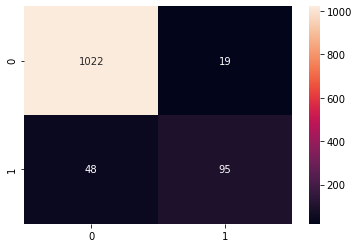

In [599]:
print(sns.heatmap(confusion_matrix(y_test, pred_test),annot=True,fmt='2g'));

In [422]:
print(classification_report(y_test, pred_test))

              precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      1041
         1.0       0.83      0.66      0.74       143

    accuracy                           0.94      1184
   macro avg       0.89      0.82      0.85      1184
weighted avg       0.94      0.94      0.94      1184



Decent recall for both train and test set. we will now try to balance the data before fiting the model.

In [423]:
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state=33)
X_res, y_res = sm.fit_resample(X_train, y_train)

In [424]:
selector_smote = selector.fit(X_res, y_res)

In [425]:
selector_smote.n_features_

15

In [426]:
pred_train_smote = selector_smote.predict(X_res)
pred_test_smote = selector_smote.predict(X_test)

In [427]:
print(classification_report(y_res, pred_train_smote))

              precision    recall  f1-score   support

         0.0       0.93      0.91      0.92      2157
         1.0       0.91      0.93      0.92      2157

    accuracy                           0.92      4314
   macro avg       0.92      0.92      0.92      4314
weighted avg       0.92      0.92      0.92      4314



AxesSubplot(0.125,0.125;0.62x0.755)


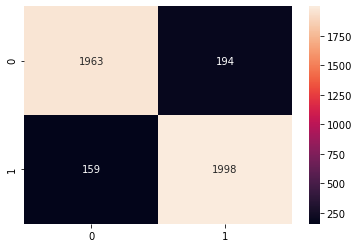

In [600]:
print(sns.heatmap(confusion_matrix(y_res, pred_train_smote),annot=True,fmt='2g'));

In [428]:
print(classification_report(y_test, pred_test_smote))

              precision    recall  f1-score   support

         0.0       0.99      0.87      0.93      1041
         1.0       0.51      0.95      0.66       143

    accuracy                           0.88      1184
   macro avg       0.75      0.91      0.79      1184
weighted avg       0.93      0.88      0.90      1184



AxesSubplot(0.125,0.125;0.62x0.755)


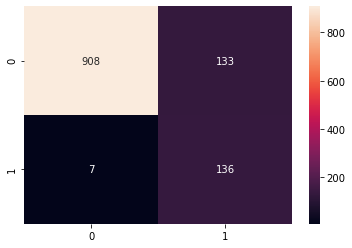

In [601]:
print(sns.heatmap(confusion_matrix(y_test, pred_test_smote),annot=True,fmt='2g'));

Finally, we are able to achieve a descent recall value without overfitting. Considering the opportunities such as outliers, missing values and correlated features this is a fairly good model. It can be improved if we get better quality data where the features explaining the default are not missing to this extent. Of course we can try other techniques which are not sensitive towards missing values and outliers.

### Model Building using Logistic Regression for 'Probability at default'

Statsmodels Logit Modeling with backward elimination.
After each model is built, the variable that has a p-value of >0.05 will be dropped as their coefficients are unreliable.

### Feature Selection

Since there are too many columns, we need to determine the columns which are related and eliminate them if possible. We will use VIF to determine the collinearity and eliminate using a threshold of 5.

In [60]:
#vif calculation

def calculate_vif_(predictors, thresh = 5):
    cols = predictors.columns
    variables = np.arange(predictors.shape[1])
    dropped=True
    while dropped:
        dropped=False
        c = predictors[cols[variables]].values
        vif = [variance_inflation_factor(c, ix) for ix in np.arange(c.shape[1])]

        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + predictors[cols[variables]].columns[maxloc] + '\' at index: ' + str(maxloc))
            variables = np.delete(variables, maxloc)
            dropped=True
    
    
    print('Remaining variables:')
    print(predictors.columns[variables])
    return predictors[cols[variables]]

In [61]:
predictors=calculate_vif_(predictors,5)

dropping 'Net_Sales' at index: 10
dropping 'ROG-Gross_Sales_perc' at index: 34
dropping 'Value_Of_Output' at index: 11
dropping 'PAT' at index: 17
dropping 'PBDT' at index: 14
dropping 'Gross_Sales' at index: 9
dropping 'Total_Assets_to_Liabilities_' at index: 8
dropping 'PBDTM_perc[Latest]' at index: 47
dropping 'ROG-PBDT_perc' at index: 33
dropping 'Current_Assets_' at index: 6
dropping 'PBIT' at index: 11
dropping 'Adjusted_PAT' at index: 12
dropping 'CP' at index: 12
dropping 'ROG-PBIDT_perc' at index: 28
dropping 'Capital_Employed' at index: 2
dropping 'PBITM_perc[Latest]' at index: 39
dropping 'Value_of_Output_to_Total_Assets' at index: 44
dropping 'Cost_of_Production' at index: 7
dropping 'Book_Value_Unit_Curr' at index: 13
dropping 'ROG-PBT_perc' at index: 26
dropping 'CPM_perc[Latest]' at index: 36
Remaining variables:
Index(['Equity_Paid_Up', 'Networth', 'Total_Debt', 'Gross_Block_',
       'Net_Working_Capital_', 'Current_Liabilities_and_Provisions_',
       'Other_Income', 

In [62]:
predictors

,Equity_Paid_Up,Networth,Total_Debt,Gross_Block_,Net_Working_Capital_,Current_Liabilities_and_Provisions_,Other_Income,Selling_Cost,PBIDT,PBT,...,Inventory_Ratio[Latest],Debtors_Ratio[Latest],Total_Asset_Turnover_Ratio[Latest],Interest_Cover_Ratio[Latest],PBIDTM_perc[Latest],APATM_perc[Latest],Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Gross_Block
0,-0.04,-0.37,0.06,-0.37,-0.22,-0.34,3.44,-0.51,-0.24,-0.91,...,-0.83,-0.93,-0.91,-0.65,-0.81,-0.61,-0.95,-0.95,-0.05,-0.81
1,1.73,-0.21,1.02,1.13,0.68,1.01,0.41,-0.01,0.24,0.01,...,0.46,1.31,-0.58,-0.94,-1.66,-0.19,-0.43,1.21,-0.81,-0.71
2,0.88,2.01,-0.03,2.13,0.12,1.85,1.14,0.60,1.57,0.04,...,-0.83,-0.84,-0.91,-1.56,-0.13,-0.06,0.79,0.38,-0.85,-0.91
3,0.13,0.47,0.42,0.66,0.90,0.15,-0.32,1.18,0.19,-0.52,...,-0.27,1.08,-0.91,-0.63,-1.08,-0.72,0.72,0.40,-0.81,-0.06
4,1.32,1.27,0.91,0.81,0.28,0.22,0.75,0.49,0.89,0.03,...,-0.83,-0.65,-0.90,-0.89,0.00,-0.91,0.73,1.10,-0.85,-0.79
5,0.52,-0.73,-0.44,-0.60,-0.78,-0.37,-0.58,-0.51,-0.48,-0.33,...,-0.83,-0.93,-0.91,-0.56,-0.81,-0.61,-0.95,-0.95,-0.85,-0.81
6,2.28,-0.26,0.73,0.32,-0.49,0.29,-0.25,0.33,-0.57,-0.07,...,-0.78,-0.85,-0.91,-0.71,-0.60,-0.94,0.68,-0.69,0.65,-0.81
7,0.41,-1.14,0.19,0.53,-1.31,0.83,2.68,-0.28,-0.06,-0.87,...,-0.77,-0.89,-0.88,-0.82,-0.39,-0.60,0.58,-0.01,-0.07,-0.82
8,1.29,0.54,0.40,1.61,0.63,1.90,1.33,0.58,1.20,0.29,...,0.21,2.11,-0.91,-2.24,-0.65,-1.01,-0.34,2.15,-0.81,-0.69
9,0.66,1.70,0.92,2.53,1.51,2.39,1.35,2.94,2.48,1.17,...,1.21,-0.74,-0.26,0.30,0.80,1.09,0.22,0.68,0.26,-0.35


In [63]:
CR_new=pd.concat([predictors,response],axis=1)

In [64]:
CR_new

,Equity_Paid_Up,Networth,Total_Debt,Gross_Block_,Net_Working_Capital_,Current_Liabilities_and_Provisions_,Other_Income,Selling_Cost,PBIDT,PBT,...,Debtors_Ratio[Latest],Total_Asset_Turnover_Ratio[Latest],Interest_Cover_Ratio[Latest],PBIDTM_perc[Latest],APATM_perc[Latest],Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Gross_Block,default
0,-0.04,-0.37,0.06,-0.37,-0.22,-0.34,3.44,-0.51,-0.24,-0.91,...,-0.93,-0.91,-0.65,-0.81,-0.61,-0.95,-0.95,-0.05,-0.81,1.00
1,1.73,-0.21,1.02,1.13,0.68,1.01,0.41,-0.01,0.24,0.01,...,1.31,-0.58,-0.94,-1.66,-0.19,-0.43,1.21,-0.81,-0.71,1.00
2,0.88,2.01,-0.03,2.13,0.12,1.85,1.14,0.60,1.57,0.04,...,-0.84,-0.91,-1.56,-0.13,-0.06,0.79,0.38,-0.85,-0.91,1.00
3,0.13,0.47,0.42,0.66,0.90,0.15,-0.32,1.18,0.19,-0.52,...,1.08,-0.91,-0.63,-1.08,-0.72,0.72,0.40,-0.81,-0.06,1.00
4,1.32,1.27,0.91,0.81,0.28,0.22,0.75,0.49,0.89,0.03,...,-0.65,-0.90,-0.89,0.00,-0.91,0.73,1.10,-0.85,-0.79,1.00
5,0.52,-0.73,-0.44,-0.60,-0.78,-0.37,-0.58,-0.51,-0.48,-0.33,...,-0.93,-0.91,-0.56,-0.81,-0.61,-0.95,-0.95,-0.85,-0.81,1.00
6,2.28,-0.26,0.73,0.32,-0.49,0.29,-0.25,0.33,-0.57,-0.07,...,-0.85,-0.91,-0.71,-0.60,-0.94,0.68,-0.69,0.65,-0.81,1.00
7,0.41,-1.14,0.19,0.53,-1.31,0.83,2.68,-0.28,-0.06,-0.87,...,-0.89,-0.88,-0.82,-0.39,-0.60,0.58,-0.01,-0.07,-0.82,1.00
8,1.29,0.54,0.40,1.61,0.63,1.90,1.33,0.58,1.20,0.29,...,2.11,-0.91,-2.24,-0.65,-1.01,-0.34,2.15,-0.81,-0.69,1.00
9,0.66,1.70,0.92,2.53,1.51,2.39,1.35,2.94,2.48,1.17,...,-0.74,-0.26,0.30,0.80,1.09,0.22,0.68,0.26,-0.35,1.00


### Split of default variable

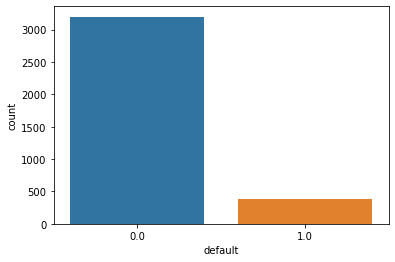

In [65]:
sns.countplot(CR_new['default']);

In [66]:
CR_new['default'].value_counts()

0.00    3198
1.00     388
Name: default, dtype: int64

In [71]:
CR_new.groupby(CR_new['default']).sum().T

default,0.00,1.00
Equity_Paid_Up,198.90,76.30
Networth,1069.29,-263.94
Total_Debt,316.61,147.36
Gross_Block_,625.86,102.39
Net_Working_Capital_,655.16,-133.40
Current_Liabilities_and_Provisions_,645.81,77.90
Other_Income,473.90,33.38
Selling_Cost,671.45,-32.50
PBIDT,1202.71,-175.91
PBT,1196.65,-206.74


### Barplots

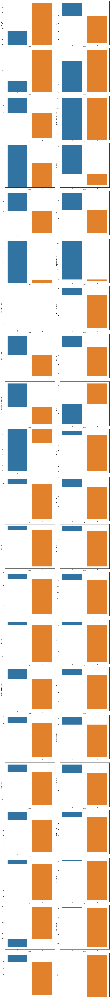

In [75]:
fig, ax = plt.subplots(figsize = (20, 180), nrows = 21, ncols = 2)

for i, col in enumerate(CR_new.columns):
    sns.barplot(x = CR_new['default'], y = CR_new[col], ax = ax[i//2, i%2],ci=None)
    
plt.tight_layout(pad = 1.1)

The credit risk data set is quite imbalanced, so one needs to apply SMOTE before evaluating all the models on both SMOTE as well as non-SMOTE dataset for comparison

In [76]:
CR_smote=CR_new.copy()

In [79]:
print("Before OverSampling the shape of predictors: {}".format(predictors.shape))
print("Before OverSampling the shape of response: {}".format(response.shape))

print("Before OverSampling, counts of label '1': {}".format(sum(response==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(response==0)))

Before OverSampling the shape of predictors: (3586, 41)
Before OverSampling the shape of response: (3586,)
Before OverSampling, counts of label '1': 388
Before OverSampling, counts of label '0': 3198 



In [82]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=33)

In [187]:
predictors_smote,response_smote=sm.fit_resample(predictors,response.ravel())

In [269]:
print("After OverSampling the shape of predictors: {}".format(predictors_smote.shape))
print("After OverSampling the shape of response: {}".format(response_smote.shape))
print("After OverSampling, counts of label '1': {}".format(sum(response_smote==1)))
print("After OverSampling, counts of label '0': {} \n".format(sum(response_smote==0)))

After OverSampling the shape of predictors: (6396, 62)
After OverSampling the shape of response: (6396,)
After OverSampling, counts of label '1': 3198
After OverSampling, counts of label '0': 3198 



In [271]:
X=predictors
y=response

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.33, random_state = 42, stratify = y)

In [280]:
sm = SMOTE(random_state=0)
X_train_res, y_train_res = sm.fit_resample(X_train, y_train)

In [284]:
y_train_res.value_counts(normalize=True)

1.00   0.50
0.00   0.50
Name: default, dtype: float64

In [286]:
Log_reg_smote=LogisticRegression(tol=0.00001,max_iter =2000)

In [287]:
Log_reg_smote=Log_reg_smote.fit(X_train_res, y_train_res)

In [296]:
X_smote,y_smote=sm.fit_resample(X,y.ravel())

In [298]:
X_train_smote, X_test_smote, y_train_smote, y_test_smote = train_test_split(X_smote, y_smote, test_size = 0.33, random_state = 42, stratify = y_smote)

### Concatinating X and y, so they can be used with statsmodel library

In [300]:
df_train = pd.concat([X_train, y_train], axis = 1)
df_test = pd.concat([X_test, y_test], axis = 1)

In [302]:
df_train

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block_,Net_Working_Capital_,Current_Assets_,Current_Liabilities_and_Provisions_,Total_Assets_to_Liabilities_,Gross_Sales,...,PBITM_perc[Latest],PBDTM_perc[Latest],CPM_perc[Latest],APATM_perc[Latest],Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
842,-0.71,-0.54,-0.61,-0.57,-0.58,-0.51,-0.63,-0.61,-0.64,-0.60,...,2.49,1.73,1.57,0.34,-0.95,-0.95,-0.85,-0.81,-0.71,0.00
1057,-0.55,-0.51,-0.59,-0.57,-0.59,-0.49,-0.62,-0.61,-0.63,-0.59,...,-1.38,-0.98,-1.06,-2.09,-0.81,-0.67,-0.72,0.39,0.81,0.00
1595,0.35,-0.37,-0.52,-0.57,-0.60,-0.19,-0.47,-0.60,-0.57,-0.60,...,-0.55,-0.54,-0.58,-0.40,0.06,-0.95,0.07,-0.27,-0.81,0.00
100,-0.22,-1.58,-1.15,-0.50,-0.33,-3.11,-0.56,2.13,-0.45,-0.60,...,0.01,-0.30,-0.35,-0.37,-0.21,-0.63,0.38,-0.94,-0.78,1.00
1191,-0.63,-0.50,-0.46,-0.19,-0.49,-0.37,-0.34,-0.17,-0.43,0.50,...,-0.29,-0.38,-0.45,-0.26,-0.00,-0.35,-0.85,0.86,0.78,0.00
2163,-1.00,0.00,-0.32,-0.56,-0.37,-0.48,-0.52,-0.41,-0.38,-0.37,...,-0.09,0.23,0.41,0.44,-0.20,-0.54,-0.12,0.04,-0.12,0.00
2763,-0.36,1.81,1.05,0.61,0.83,3.13,1.73,0.48,0.81,1.98,...,-0.14,-0.05,-0.09,-0.10,0.34,-0.05,1.38,0.70,0.49,0.00
2701,-0.59,1.39,0.47,-0.48,2.57,0.55,0.18,-0.04,0.28,0.29,...,0.39,0.84,0.78,0.53,0.57,-0.33,0.34,0.42,-0.51,0.00
2072,2.41,-0.08,-0.36,-0.57,-0.60,-0.58,-0.67,-0.61,-0.46,-0.60,...,-0.73,-0.69,-0.70,-0.63,-0.17,-0.00,0.51,-0.64,-0.62,0.00
2349,0.33,0.31,0.29,0.74,0.77,0.84,0.90,1.10,0.39,0.86,...,0.04,-0.05,-0.08,-0.19,0.61,0.76,0.67,0.93,0.07,0.00


In [303]:
df_test

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block_,Net_Working_Capital_,Current_Assets_,Current_Liabilities_and_Provisions_,Total_Assets_to_Liabilities_,Gross_Sales,...,PBITM_perc[Latest],PBDTM_perc[Latest],CPM_perc[Latest],APATM_perc[Latest],Debtors_Velocity_Days,Creditors_Velocity_Days,Inventory_Velocity_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
251,-0.83,-0.68,-0.66,-0.46,-0.58,-0.66,-0.64,-0.48,-0.64,-0.60,...,-0.72,-1.17,-1.30,-1.52,-0.00,0.82,-0.17,2.58,3.45,1.00
3493,-0.27,-0.36,-0.41,-0.32,-0.43,-0.44,-0.50,-0.42,-0.45,-0.38,...,0.43,0.51,0.36,0.17,-0.61,-0.28,-0.49,-0.72,-0.71,0.00
3063,2.44,1.18,2.41,-0.57,-0.52,-0.48,-0.57,-0.52,1.60,-0.59,...,-2.29,-2.18,-0.88,-0.36,-0.95,-0.86,-0.85,-0.94,-0.51,0.00
2384,-0.74,0.43,0.15,0.11,-0.15,1.31,0.66,0.15,0.08,0.16,...,-0.42,-0.67,-0.40,-0.45,2.69,0.61,1.07,0.42,0.36,0.00
1679,-0.26,-0.36,-0.52,-0.57,-0.40,-0.55,-0.64,-0.58,-0.56,-0.58,...,0.15,0.05,0.06,0.02,-0.18,-0.95,1.59,-0.69,-0.56,0.00
604,-1.02,-0.57,-0.63,-0.57,-0.59,-0.58,-0.65,-0.58,-0.64,-0.59,...,1.63,2.35,2.36,2.56,0.21,1.23,-0.79,-0.09,-0.27,0.00
3434,2.09,1.93,1.85,1.41,1.57,1.94,2.58,2.09,1.86,2.27,...,0.26,0.13,0.02,0.30,-0.16,0.04,0.54,0.91,0.96,0.00
2244,-0.73,-0.06,-0.24,-0.22,-0.19,0.05,-0.05,0.00,-0.24,0.14,...,1.56,1.72,1.37,1.96,0.75,-0.28,0.22,0.97,0.32,0.00
2523,0.00,0.65,0.04,-0.57,-0.52,0.09,-0.33,-0.61,-0.16,-0.60,...,-0.72,-0.71,-0.72,-0.61,-0.95,-0.95,-0.85,-0.97,-0.81,0.00
2162,-0.94,-0.08,-0.22,-0.20,0.39,-0.50,-0.50,-0.36,-0.30,-0.13,...,-0.42,-0.00,0.09,-0.37,-0.90,-0.69,-0.23,1.44,-0.35,0.00


In [429]:
df_train_smote = pd.concat([X_train_smote, pd.DataFrame(y_train_smote,index=X_train_smote.index)], axis = 1)
df_test_smote = pd.concat([X_test_smote, pd.DataFrame(y_test_smote,index=X_test_smote.index)], axis = 1)

In [430]:
f_1 = 'default ~ Equity_Paid_Up + Networth + Total_Debt + Gross_Block_ + Net_Working_Capital_ + Current_Liabilities_and_Provisions_ + Other_Income'

### Fitting the logistic regression model on imbalanced data

In [431]:
model_1 = SM.logit(formula = f_1, data= df_train).fit()

Optimization terminated successfully.
         Current function value: 0.224185
         Iterations 9


### Checking the parameters

In [432]:
model_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2394
Method:                           MLE   Df Model:                            7
Date:                Sun, 09 Jan 2022   Pseudo R-squ.:                  0.3461
Time:                        05:51:29   Log-Likelihood:                -538.49
converged:                       True   LL-Null:                       -823.47
Covariance Type:            nonrobust   LLR p-value:                7.167e-119
=======================================================================================================
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                              -3.1823      0.147    -21.670      0.000      -3.470      -2.894
Equity_Paid_Up                          0.5689      0.108      5.285      0.000       0.358       0.780
Networth                               -3.8834      0.329    -11.787      0.000      -4.529      -3.238
Total_Debt                              0.4673      0.170      2.752      0.006       0.135       0.800
Gross_Block_                            0.5600      0.177      3.161      0.002       0.213       0.907
Net_Working_Capital_                   -0.3988      0.158     -2.530      0.011      -0.708      -0.090
Current_Liabilities_and_Provisions_     0.2351      0.171      1.371      0.170      -0.101       0.571
Other_Income                            0.3079      0.132      2.334      0.020       0.049       0.566
=======================================================================================================
"""

### Validating the model on train set

In [434]:
y_pred_train = np.where(model_1.predict(df_train) > 0.5, 1, 0)

In [435]:
from sklearn.metrics import confusion_matrix, classification_report

In [436]:
print(confusion_matrix(y_train, y_pred_train))

[[2063   94]
 [ 236    9]]


AxesSubplot(0.125,0.125;0.62x0.755)


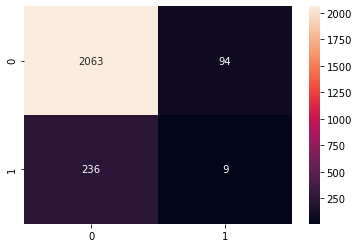

In [602]:
print(sns.heatmap(confusion_matrix(y_train, y_pred_train),annot=True,fmt='2g'));

In [437]:
print(classification_report(y_train, y_pred_train))

              precision    recall  f1-score   support

         0.0       0.90      0.96      0.93      2157
         1.0       0.09      0.04      0.05       245

    accuracy                           0.86      2402
   macro avg       0.49      0.50      0.49      2402
weighted avg       0.81      0.86      0.84      2402



### Validating the model on test set

In [438]:
y_pred_test = np.where(model_1.predict(df_test) > 0.5, 1, 0)

In [439]:
print(confusion_matrix(y_test, y_pred_test))

[[982  59]
 [139   4]]


AxesSubplot(0.125,0.125;0.62x0.755)


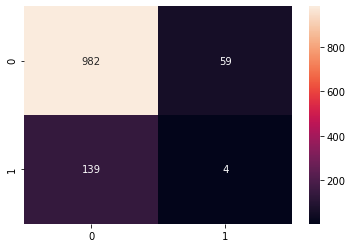

In [603]:
print(sns.heatmap(confusion_matrix(y_test, y_pred_test),annot=True,fmt='2g'));

In [440]:
print(classification_report(y_test, y_pred_test))

              precision    recall  f1-score   support

         0.0       0.88      0.94      0.91      1041
         1.0       0.06      0.03      0.04       143

    accuracy                           0.83      1184
   macro avg       0.47      0.49      0.47      1184
weighted avg       0.78      0.83      0.80      1184



Model is not overfitting but the recall is really poor.

### Fitting the logistic regression model on balanced data

In [444]:
train = pd.concat([X_train, y_train], axis = 1)
train_smote = pd.concat([X_res, y_res], axis = 1)
test = pd.concat([X_test, y_test], axis = 1)
model_2 = SM.logit(formula = f_1, data= train_smote).fit()

Optimization terminated successfully.
         Current function value: 0.442771
         Iterations 8


In [445]:
model_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                default   No. Observations:                 4314
Model:                          Logit   Df Residuals:                     4306
Method:                           MLE   Df Model:                            7
Date:                Sun, 09 Jan 2022   Pseudo R-squ.:                  0.3612
Time:                        06:05:29   Log-Likelihood:                -1910.1
converged:                       True   LL-Null:                       -2990.2
Covariance Type:            nonrobust   LLR p-value:                     0.000
=======================================================================================================
                                          coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
Intercept                              -0.9292      0.055    -17.049      0.000      -1.036      -0.822
Equity_Paid_Up                          0.7415      0.064     11.592      0.000       0.616       0.867
Networth                               -3.5765      0.154    -23.219      0.000      -3.878      -3.275
Total_Debt                              0.3860      0.098      3.937      0.000       0.194       0.578
Gross_Block_                            0.9027      0.107      8.443      0.000       0.693       1.112
Net_Working_Capital_                   -0.7301      0.091     -7.993      0.000      -0.909      -0.551
Current_Liabilities_and_Provisions_     0.6546      0.108      6.073      0.000       0.443       0.866
Other_Income                            0.2363      0.077      3.068      0.002       0.085       0.387
=======================================================================================================
"""

### Validating on resampled train set

In [447]:
y_pred_train_smote = np.where(model_2.predict(train_smote) > 0.5, 1, 0)

In [448]:
print(confusion_matrix(y_res, y_pred_train_smote))

[[1879  278]
 [ 359 1798]]


AxesSubplot(0.125,0.125;0.62x0.755)


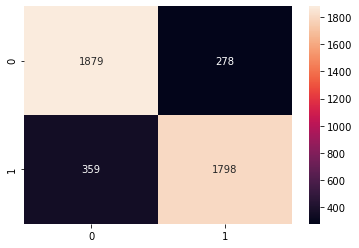

In [604]:
print(sns.heatmap(confusion_matrix(y_res, y_pred_train_smote),annot=True,fmt='2g'));

In [449]:
print(classification_report(y_res, y_pred_train_smote))

              precision    recall  f1-score   support

         0.0       0.84      0.87      0.86      2157
         1.0       0.87      0.83      0.85      2157

    accuracy                           0.85      4314
   macro avg       0.85      0.85      0.85      4314
weighted avg       0.85      0.85      0.85      4314



### Validating on test set

In [450]:
y_pred_test_smote = np.where(model_2.predict(test) > 0.5, 1, 0)

In [451]:
print(confusion_matrix(y_test, y_pred_test_smote))

[[892 149]
 [ 25 118]]


AxesSubplot(0.125,0.125;0.62x0.755)


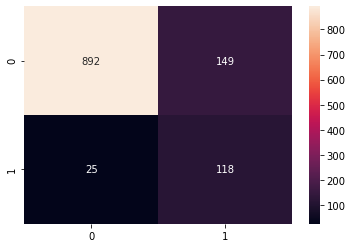

In [605]:
print(sns.heatmap(confusion_matrix(y_test, y_pred_test_smote),annot=True,fmt='2g'));

In [452]:
print(classification_report(y_test, y_pred_test_smote))

              precision    recall  f1-score   support

         0.0       0.97      0.86      0.91      1041
         1.0       0.44      0.83      0.58       143

    accuracy                           0.85      1184
   macro avg       0.71      0.84      0.74      1184
weighted avg       0.91      0.85      0.87      1184



### Conclusion
We can see that we get better recall value after balancing the data but precision is now a problem. This trade-off between recall and precision can be approached by adjusting the threshold. At present, we are using a threshold of 0.5.

Statsmodels Logit Modeling with backward elimination.
After each model is built, the variable that has a p-value of >0.05 will be dropped as their coefficients are unreliable.